In [1]:
%pip install lime shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 3.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 533.5/533.5 kB 9.4 MB/s eta 0:00:00
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=4b534cfcd9c62419e914909bb4270621c4331a0d7cd73f81159b3e3431878aea
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

import lime
import shap


In [3]:
data = pd.read_csv('./Maternal Health Risk Data Set 1.csv')

In [4]:
data.head(10)

,Age,SystolicBP,DiastolicBP,BS,BodyTemp,HeartRate,RiskLevel
0,25,130,80,15.00,98.0,86,high risk
1,35,140,90,13.00,98.0,70,high risk
2,29,90,70,8.00,100.0,80,high risk
3,30,140,85,7.00,98.0,70,high risk
4,35,120,60,6.10,98.0,76,low risk
5,23,140,80,7.01,98.0,70,high risk
6,23,130,70,7.01,98.0,78,mid risk
7,35,85,60,11.00,102.0,86,high risk
8,32,120,90,6.90,98.0,70,mid risk
9,42,130,80,18.00,98.0,70,high risk


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1014 entries, 0 to 1013
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Age          1014 non-null   int64  
 1   SystolicBP   1014 non-null   int64  
 2   DiastolicBP  1014 non-null   int64  
 3   BS           1014 non-null   float64
 4   BodyTemp     1014 non-null   float64
 5   HeartRate    1014 non-null   int64  
 6   RiskLevel    1014 non-null   object 
dtypes: float64(2), int64(4), object(1)
memory usage: 55.6+ KB


In [ ]:
data.describe()

,Age,SystolicBP,DiastolicBP,BS,BodyTemp,HeartRate
count,1014.000000,1014.000000,1014.000000,1014.000000,1014.000000,1014.000000
mean,29.871795,113.198225,76.460552,8.725986,98.665089,74.301775
std,13.474386,18.403913,13.885796,3.293532,1.371384,8.088702
min,10.000000,70.000000,49.000000,6.000000,98.000000,7.000000
25%,19.000000,100.000000,65.000000,6.900000,98.000000,70.000000
50%,26.000000,120.000000,80.000000,7.500000,98.000000,76.000000
75%,39.000000,120.000000,90.000000,8.000000,98.000000,80.000000
max,70.000000,160.000000,100.000000,19.000000,103.000000,90.000000


In [ ]:
data.isnull().sum()

Age            0
SystolicBP     0
DiastolicBP    0
BS             0
BodyTemp       0
HeartRate      0
RiskLevel      0
dtype: int64

In [5]:
print(f"There are {data.duplicated().sum()} duplicates data")
data.loc[data.duplicated(keep=False)].sort_values(by=data.columns.to_list())


There are 562 duplicates data


,Age,SystolicBP,DiastolicBP,BS,BodyTemp,HeartRate,RiskLevel
670,10,100,50,6.0,99.0,70,mid risk
849,10,100,50,6.0,99.0,70,mid risk
552,12,90,60,7.5,102.0,60,low risk
940,12,90,60,7.5,102.0,60,low risk
543,12,90,60,7.5,102.0,66,low risk
...,...,...,...,...,...,...,...
553,60,120,85,15.0,98.0,60,mid risk
772,60,120,85,15.0,98.0,60,mid risk
818,60,120,85,15.0,98.0,60,mid risk
114,63,140,90,15.0,98.0,90,high risk


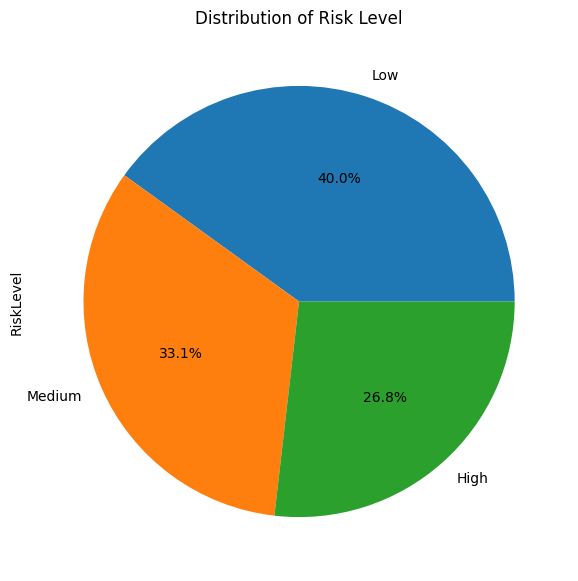

In [ ]:
# print pie chart of the distribution of the target variable
data['RiskLevel'].value_counts().plot(kind='pie', labels=['Low', 'Medium', 'High'], autopct='%1.1f%%', figsize=(10, 7))
plt.title('Distribution of Risk Level')
plt.show()

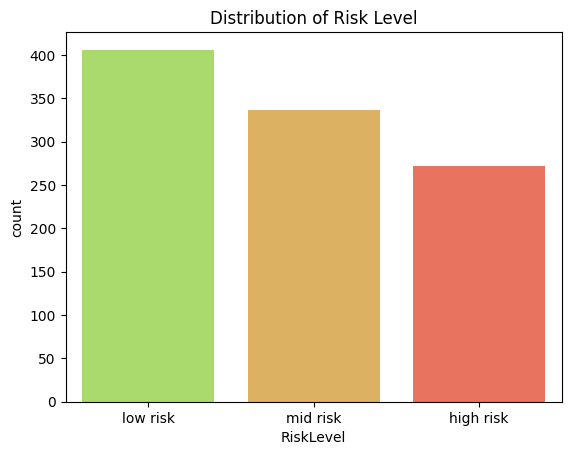

In [6]:

risk_order = ["low risk", "mid risk", "high risk"]
p_colors = ['#aceb5b', '#f0b74e', 'tomato']
sns.countplot(x="RiskLevel", data=data, order=risk_order, palette=p_colors)
plt.title("Distribution of Risk Level")
plt.show()

In [ ]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,1014.0,29.871795,13.474386,10.0,19.0,26.0,39.0,70.0
SystolicBP,1014.0,113.198225,18.403913,70.0,100.0,120.0,120.0,160.0
DiastolicBP,1014.0,76.460552,13.885796,49.0,65.0,80.0,90.0,100.0
BS,1014.0,8.725986,3.293532,6.0,6.9,7.5,8.0,19.0
BodyTemp,1014.0,98.665089,1.371384,98.0,98.0,98.0,98.0,103.0
HeartRate,1014.0,74.301775,8.088702,7.0,70.0,76.0,80.0,90.0


In [ ]:
def num_plot(data, col):
    fig, ax = plt.subplots(1, 2, figsize=(15, 5))
    sns.histplot(data=data, x=col, ax=ax[0], kde=True,)
    sns.boxplot(data=data, x=col, ax=ax[1])
    ax[0].set_title(f"Histogram of {col}")
    ax[1].set_title(f"Boxplot of {col}")
    plt.show()

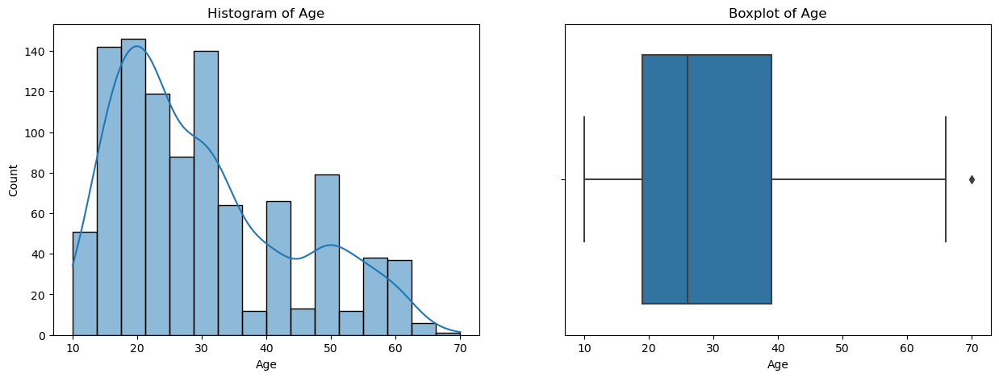

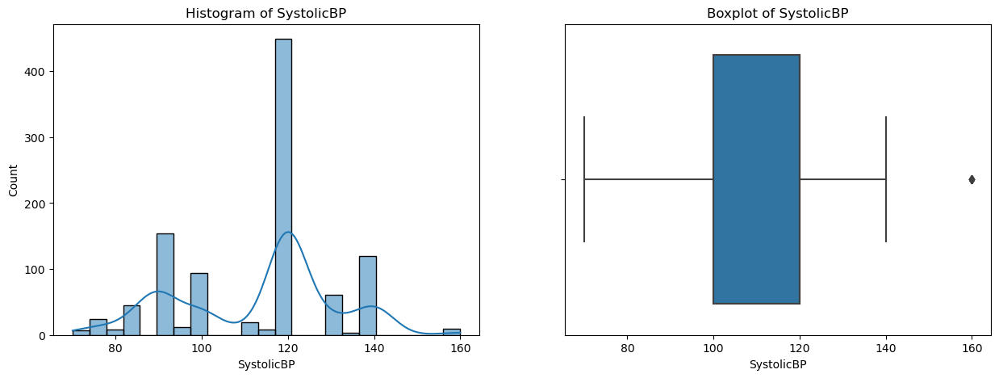

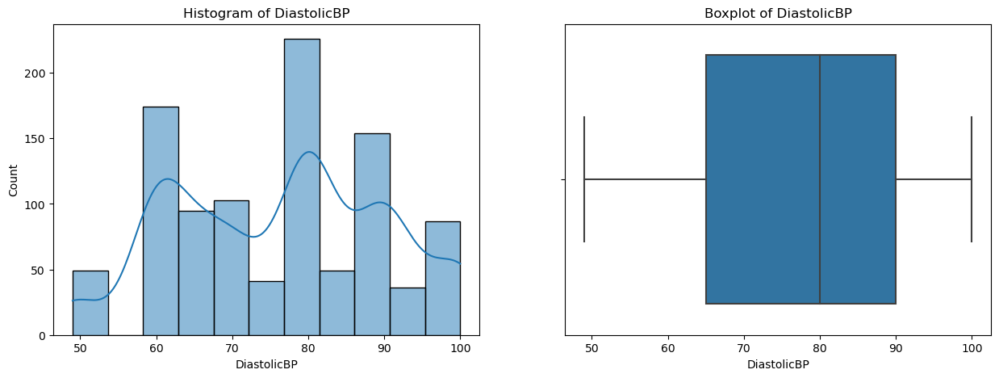

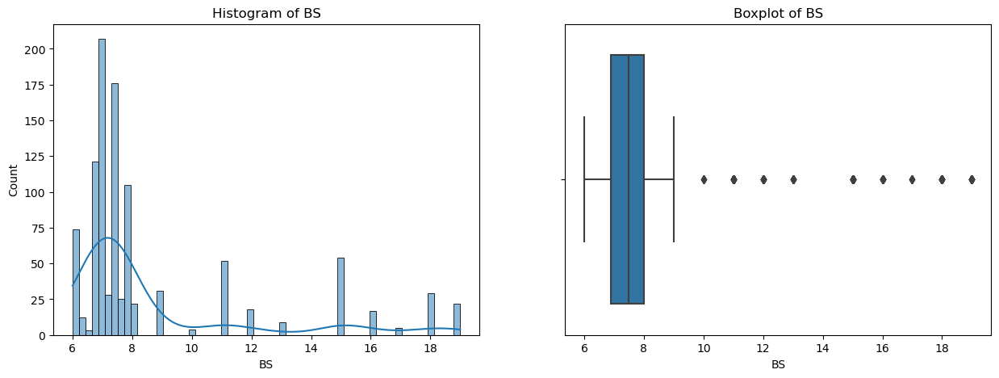

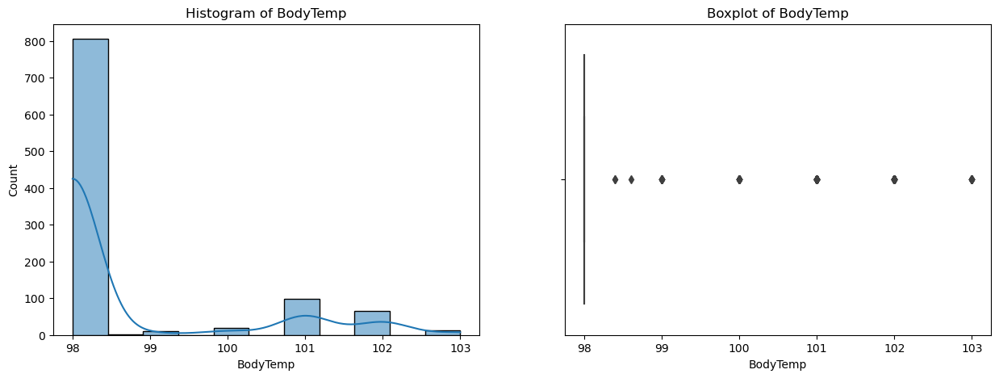

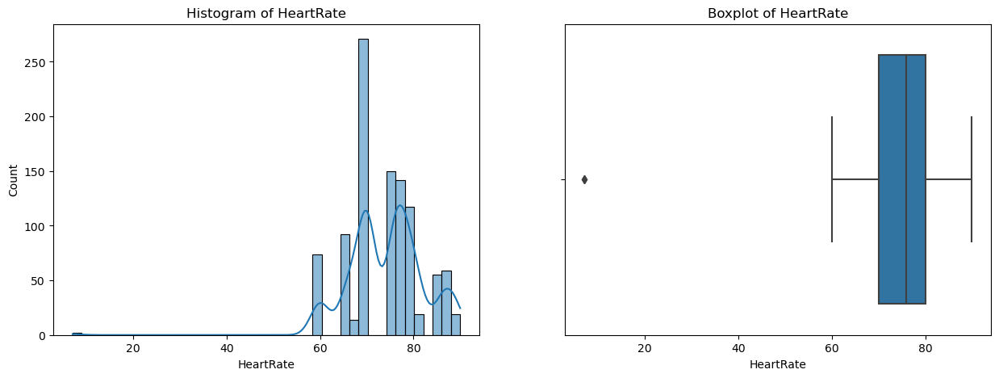

In [ ]:
columns_list = ['Age', 'SystolicBP', 'DiastolicBP', 'BS', 'BodyTemp', 'HeartRate',]
for column in columns_list:
    num_plot(data, column)

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.


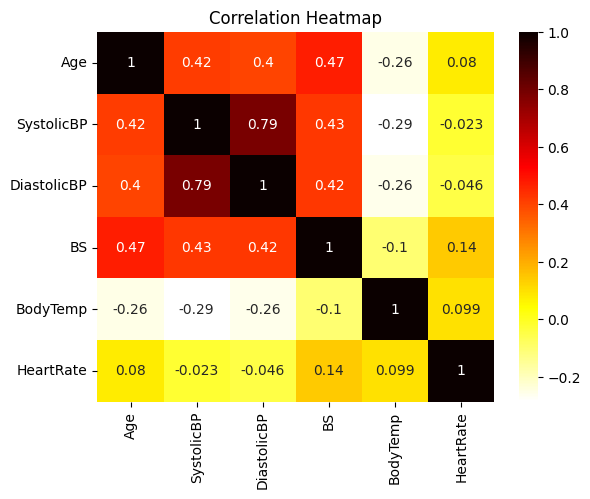

In [7]:
# bivariate analysis
sns.heatmap(data.corr(), annot=True, cmap='hot_r')
plt.title("Correlation Heatmap")
plt.show()

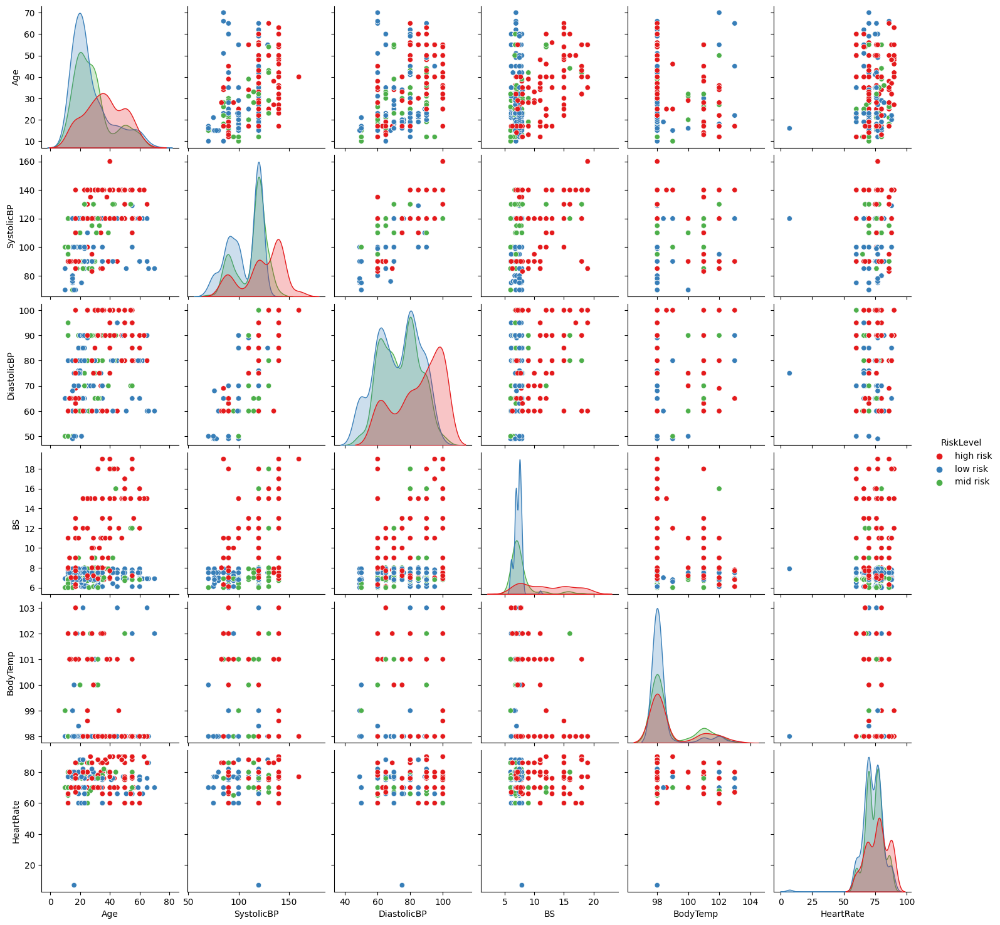

In [ ]:
sns.pairplot(data, hue='RiskLevel', palette='Set1')

Age → RiskLevel


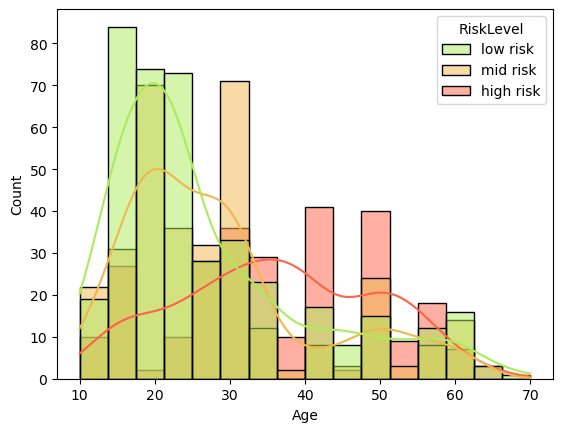

In [ ]:
sns.histplot(data=data, x='Age', hue='RiskLevel', kde=True, hue_order=risk_order, palette=p_colors)
plt.show()

In [ ]:
pd.crosstab(data.RiskLevel, data.Age).style.background_gradient(cmap='hot_r')

Age,10,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,48,49,50,51,54,55,56,59,60,62,63,65,66,70
RiskLevel,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
high risk,0,7,3,3,0,0,24,0,2,0,0,5,5,0,21,0,2,5,8,10,0,18,2,3,22,2,6,2,2,34,0,4,3,0,1,1,16,2,22,0,9,17,1,0,7,0,2,1,0,0
low risk,2,15,2,0,56,10,18,8,28,11,27,28,42,3,16,0,5,7,2,6,7,18,0,2,21,0,0,0,0,1,1,15,0,0,8,0,4,5,5,1,0,12,0,2,13,1,0,2,1,1
mid risk,2,13,7,0,4,6,21,11,37,11,11,12,24,0,11,3,2,16,30,14,15,12,3,0,7,2,0,0,2,2,0,4,2,3,0,0,6,2,16,0,3,8,0,0,14,0,0,0,0,0


Observation:

1. Pregnant women aged below 24 years mostly has low health risk.
2. Health risks will start to increase after that age (starting from the age of 25 years).
3. Surprisingly, the health risk of pregnant women over 59 years old is decreased


SystolicBP → RiskLevel


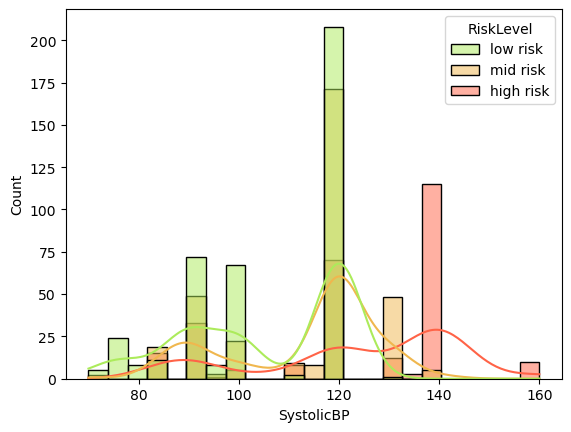

In [ ]:
sns.histplot(data=data, x="SystolicBP", hue="RiskLevel", kde=True, hue_order=risk_order, palette=p_colors)
plt.show()

In [ ]:
pd.crosstab(data.RiskLevel, data.SystolicBP).style.background_gradient(cmap='hot_r')

SystolicBP,70,75,76,78,80,83,85,90,95,99,100,110,115,120,129,130,135,140,160
RiskLevel,,,,,,,,,,,,,,,,,,,
high risk,0,0,0,0,0,2,13,33,1,0,5,8,0,70,0,12,3,115,10
low risk,5,8,16,3,5,0,11,72,8,2,65,2,0,208,1,0,0,0,0
mid risk,2,0,0,0,0,0,19,49,3,0,22,9,8,171,0,48,0,5,0


Observation:

1. Pregnant women with upper value of blood pressure >= 100 mmHg mostly has low health risk.
2. The higher pregnant women's blood pressure, the higher the health risk


DiastolicBP → RiskLevel


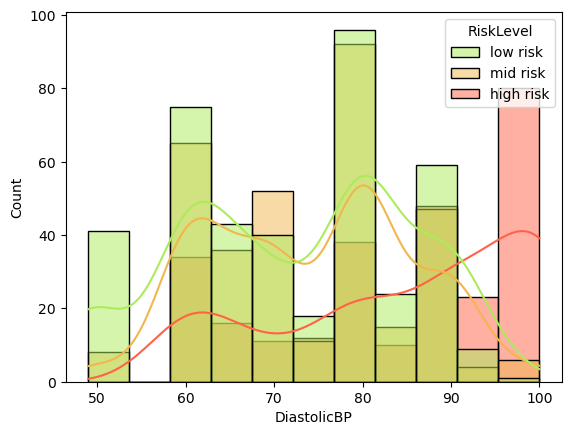

In [ ]:
sns.histplot(data=data, x="DiastolicBP", hue="RiskLevel", kde=True, hue_order=risk_order, palette=p_colors)
plt.show()

In [ ]:
pd.crosstab(data.RiskLevel, data.DiastolicBP).style.background_gradient(cmap='hot_r')

DiastolicBP,49,50,60,63,65,68,69,70,75,76,80,85,89,90,95,100
RiskLevel,,,,,,,,,,,,,,,,
high risk,0,0,34,2,14,0,1,10,12,0,38,10,0,48,23,80
low risk,25,16,75,2,41,2,0,38,15,3,96,24,1,58,9,1
mid risk,0,8,65,4,32,0,0,52,11,0,92,15,0,47,4,6


Observation:

1. This variable has pretty similar pattern as SystolicBP. This is not surprising since they're highly correlated.


BS → RiskLevel


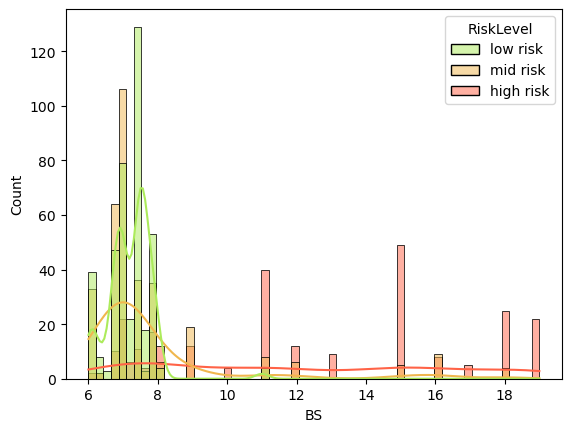

In [ ]:
sns.histplot(data=data, x="BS", hue="RiskLevel", kde=True, hue_order=risk_order, palette=p_colors)
plt.show()

In [ ]:
pd.crosstab(data.RiskLevel, data.BS).style.background_gradient(cmap='hot_r')

BS,6.000000,6.100000,6.300000,6.400000,6.500000,6.600000,6.700000,6.800000,6.900000,7.000000,7.010000,7.100000,7.200000,7.500000,7.600000,7.700000,7.800000,7.900000,8.000000,9.000000,10.000000,11.000000,12.000000,13.000000,15.000000,16.000000,17.000000,18.000000,19.000000
RiskLevel,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
high risk,0,2,2,0,0,0,0,10,8,9,5,0,6,11,0,4,5,12,12,12,4,40,12,9,49,8,5,25,22
low risk,7,32,0,8,1,2,10,37,47,29,3,8,14,129,1,17,19,34,4,0,0,4,0,0,0,0,0,0,0
mid risk,14,19,0,2,0,0,23,41,58,41,7,0,0,36,0,3,21,14,6,19,0,8,6,0,5,9,0,4,0


Observation:

1. Almost every pregnant women with blood glucose level >= 8 has high health risk.
2. But otherwise, they seems to have lower health risk with blood glucose < 8


BodyTemp → RiskLevel


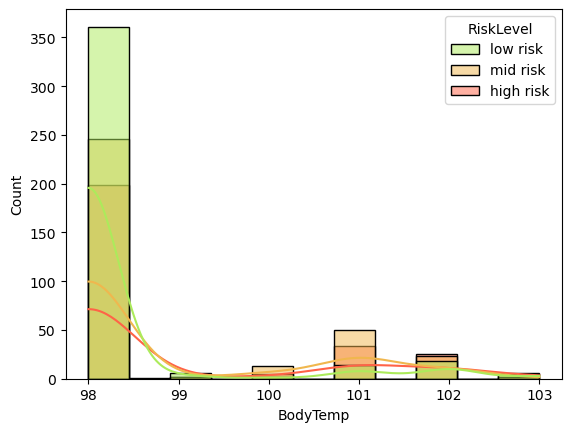

In [ ]:
sns.histplot(data=data, x="BodyTemp", hue="RiskLevel", kde=True, hue_order=risk_order, palette=p_colors)
plt.show()

In [ ]:
pd.crosstab(data.RiskLevel, data.BodyTemp).style.background_gradient(cmap='hot_r')

BodyTemp,98.000000,98.400000,98.600000,99.000000,100.000000,101.000000,102.000000,103.000000
RiskLevel,,,,,,,,
high risk,199,0,1,2,5,34,25,6
low risk,359,2,0,6,2,14,18,5
mid risk,246,0,0,2,13,50,23,2


Observation:

1. Most pregnant women seem to have a body temperature of 98 F, which is normal body temperature
2. Pregnant women with body temperature >= 100 mostly has higher health risk


HeartRate → RiskLevel


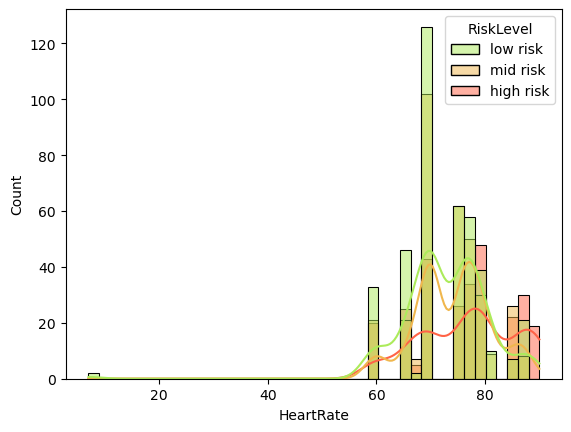

In [ ]:
sns.histplot(data=data, x="HeartRate", hue="RiskLevel", kde=True, hue_order=risk_order, palette=p_colors)
plt.show()

In [ ]:
pd.crosstab(data.RiskLevel, data.HeartRate).style.background_gradient(cmap='hot_r')

HeartRate,7,60,65,66,67,68,70,75,76,77,78,80,82,86,88,90
RiskLevel,,,,,,,,,,,,,,,,
high risk,0,20,0,25,5,0,43,6,20,25,9,48,0,22,30,19
low risk,2,33,2,44,2,0,126,7,55,56,2,39,10,7,21,0
mid risk,0,21,3,18,5,2,102,6,56,15,35,30,9,26,8,0


Observation:

1. As i mentioned before, HeartRate variable has outlier that with a value that looks unnatural, which is 6 bpm.
2. Health risks seem to be getting higher along with the number of heart rate.


Outlier handling for HeartRate variable:


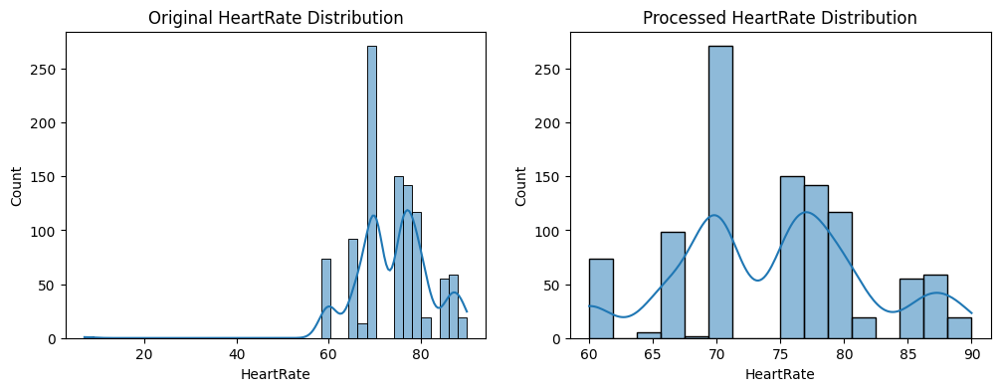

In [8]:
data_proc = data.drop(data.index[data.HeartRate == 7]) # drop the records that has heart rate of 7

fig, ax = plt.subplots(1, 2, figsize=(12, 4))
sns.histplot(data=data, x="HeartRate", kde=True, ax=ax[0])
sns.histplot(data=data_proc, x="HeartRate", kde=True, ax=ax[1])
ax[0].set_title("Original HeartRate Distribution")
ax[1].set_title("Processed HeartRate Distribution")
plt.show()

Removing irrelevant features


In [ ]:
data_proc = data_proc.drop(['HeartRate'], axis=1)

In [9]:
data_proc.head()

,Age,SystolicBP,DiastolicBP,BS,BodyTemp,HeartRate,RiskLevel
0,25,130,80,15.0,98.0,86,high risk
1,35,140,90,13.0,98.0,70,high risk
2,29,90,70,8.0,100.0,80,high risk
3,30,140,85,7.0,98.0,70,high risk
4,35,120,60,6.1,98.0,76,low risk


In [10]:
label_encoder = LabelEncoder()
data_proc['RiskLevel'] = label_encoder.fit_transform(data_proc['RiskLevel'])

In [11]:
data_proc['RiskLevel'].unique()

array([0, 1, 2])

In [12]:
data_proc['RiskLevel'].value_counts()

1    404
2    336
0    272
Name: RiskLevel, dtype: int64

In [13]:
features = data_proc.drop(['RiskLevel'], axis=1)
target = data_proc['RiskLevel']

In [14]:
feature_train, feature_test, target_train, target_test = train_test_split(features, target, test_size=0.2, random_state=1)

In [15]:
print(feature_train.shape)
print(feature_test.shape)
print(target_train.shape)
print(target_test.shape)

(809, 6)
(203, 6)
(809,)
(203,)


In [16]:
from imblearn.over_sampling import SMOTE


smote = SMOTE(random_state=42)
X_smote, y_smote = smote.fit_resample(features, target)

print(f'''Shape of X before SMOTE: {features.shape}
          Shape of X after SMOTE: {X_smote.shape}''')

# print('\nBalance of positive and negative classes (%):')
# y_smote.value_counts(normalize=True) * 100

Shape of X before SMOTE: (1012, 6)
          Shape of X after SMOTE: (1212, 6)


In [17]:
y_smote.value_counts()

0    404
1    404
2    404
Name: RiskLevel, dtype: int64

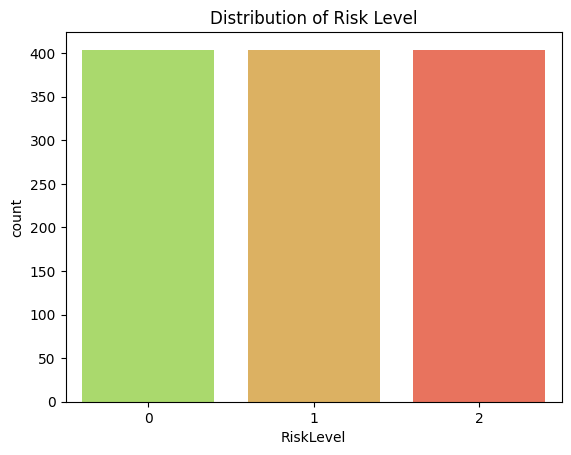

In [ ]:
risk_order = [0, 1, 2]
p_colors = ['#aceb5b', '#f0b74e', 'tomato']
sns.countplot(x=y_smote, order=risk_order, palette=p_colors)
plt.title("Distribution of Risk Level")
plt.show()

In [18]:
# smote split

X_smote_train, X_smote_test, y_smote_train, y_smote_test = train_test_split(X_smote, y_smote, test_size=0.2, random_state=1)

random forest smote


In [76]:
rf_smote = RandomForestClassifier(random_state=100)
rf_smote.fit(X_smote_train, y_smote_train)
target_pred_smote = rf_smote.predict(X_smote_test)
print(f"Accuracy of Random Forest Classifier on test set: {accuracy_score(y_smote_test, target_pred_smote)*100}")

Accuracy of Random Forest Classifier on test set: 87.65432098765432


1. Random Forest Classifier


In [77]:
rf = RandomForestClassifier(random_state=100)
rf.fit(feature_train, target_train)
target_pred = rf.predict(feature_test)
print(f"Accuracy of Random Forest Classifier on test set: {accuracy_score(target_test, target_pred)*100}")

Accuracy of Random Forest Classifier on test set: 88.66995073891626


In [78]:
# smote hyper params tuning

# hyper parameter tuning

param_grid = {
    "n_estimators" : [10, 20, 50, 100],
    'criterion': ['gini', 'entropy'],
}

rf_smote = RandomForestClassifier(random_state=100)
grid_smote = GridSearchCV(rf_smote, param_grid, cv = 10)
grid_smote.fit(X_smote_train, y_smote_train)
print("Best HyperParameter --> ", grid_smote.best_params_)


Best HyperParameter -->  {'criterion': 'gini', 'n_estimators': 100}


In [79]:
target_pred = grid_smote.predict(X_smote_test)
print("Accuracy of Random Forest Classifier after tuning --> ", accuracy_score(y_smote_test, target_pred)*100)

Accuracy of Random Forest Classifier after tuning -->  87.65432098765432


In [80]:
# classification report
print(classification_report(y_smote_test, target_pred, digits=4))

              precision    recall  f1-score   support

           0     0.9500    0.9620    0.9560        79
           1     0.8642    0.8333    0.8485        84
           2     0.8171    0.8375    0.8272        80

    accuracy                         0.8765       243
   macro avg     0.8771    0.8776    0.8772       243
weighted avg     0.8766    0.8765    0.8764       243



Hyper Parameter Tuning


In [81]:
# hyper parameter tuning

param_grid = {
    "n_estimators" : [10, 20, 50, 100],
    'criterion': ['gini', 'entropy'],
}

rf = RandomForestClassifier(random_state=100)
grid = GridSearchCV(rf, param_grid, cv = 10)
grid.fit(feature_train, target_train)
print("Best HyperParameter --> ", grid.best_params_)

Best HyperParameter -->  {'criterion': 'entropy', 'n_estimators': 50}


In [82]:
target_pred = grid.predict(feature_test)
print("Accuracy of Random Forest Classifier after tuning --> ", accuracy_score(target_test, target_pred)*100)


Accuracy of Random Forest Classifier after tuning -->  87.68472906403942


In [83]:
# classification report
print(classification_report(target_test, target_pred, digits=4))

              precision    recall  f1-score   support

           0     0.9524    0.9375    0.9449        64
           1     0.8831    0.8608    0.8718        79
           2     0.7937    0.8333    0.8130        60

    accuracy                         0.8768       203
   macro avg     0.8764    0.8772    0.8766       203
weighted avg     0.8785    0.8768    0.8775       203



In [84]:
xgb_smote = XGBClassifier()
xgb_smote.fit(X_smote_train, y_smote_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

In [85]:

predictions= xgb_smote.predict(X_smote_test)
percentage=xgb_smote.score(X_smote_test,y_smote_test)
res=confusion_matrix(y_smote_test,predictions)
print("validation confusion matrix")
print(res)
print(classification_report(y_smote_test, predictions, digits=4))
# check the accuracy on the training set
# print('training accuracy = ',accuracy_score(feature_train, target_train))
# print('testing accuracy = ',accuracy_score(X_smote_test, y_smote_test))

target_pred = xgb_smote.predict(X_smote_test)
print('Accuracy of XGBoost Classifier on test set: {:.2f}'.format(accuracy_score(y_smote_test, target_pred)*100))


validation confusion matrix
[[76  0  3]
 [ 3 74  7]
 [ 3 11 66]]
              precision    recall  f1-score   support

           0     0.9268    0.9620    0.9441        79
           1     0.8706    0.8810    0.8757        84
           2     0.8684    0.8250    0.8462        80

    accuracy                         0.8889       243
   macro avg     0.8886    0.8893    0.8887       243
weighted avg     0.8882    0.8889    0.8882       243

Accuracy of XGBoost Classifier on test set: 88.89


ELI5


In [30]:
%pip install eli5

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.2/216.2 kB 3.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107717 sha256=5fb75092d538d0e6de5b687ed7eab109ea37d4ea62b603d06c70945abfb123ee
  Stored in directory: /root/.cache/pip/wheels/b8/58/ef/2cf4c306898c2338d51540e0922c8e0d6028e07007085c0004
Successfully built eli5


In [31]:
import eli5

In [32]:
feature_names = ['Age', 'SystolicBP', 'DiastolicBP', 'BS', 'BodyTemp', 'HeartRate']
feature_names

['Age', 'SystolicBP', 'DiastolicBP', 'BS', 'BodyTemp', 'HeartRate']

In [33]:
eli5.show_weights(xgb_smote, feature_names=feature_names)

Weight,Feature
0.3496,SystolicBP
0.2465,BS
0.1730,BodyTemp
0.0855,Age
0.0784,DiastolicBP
0.0671,HeartRate


2. XGBoost Classifier


In [86]:
xgb = XGBClassifier()
xgb.fit(feature_train, target_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

In [87]:

predictions= xgb.predict(feature_test)
percentage=xgb.score(feature_test,target_test)
res=confusion_matrix(target_test,predictions)
print("validation confusion matrix")
print(res)
print(classification_report(target_test, predictions, digits=4))
# check the accuracy on the training set
# print('training accuracy = ',accuracy_score(feature_train, target_train))
# print('testing accuracy = ',accuracy_score(feature_test, target_test))

target_pred = xgb.predict(feature_test)
print('Accuracy of XGBoost Classifier on test set: {:.2f}'.format(accuracy_score(target_test, target_pred)*100))


validation confusion matrix
[[60  1  3]
 [ 1 70  8]
 [ 2  8 50]]
              precision    recall  f1-score   support

           0     0.9524    0.9375    0.9449        64
           1     0.8861    0.8861    0.8861        79
           2     0.8197    0.8333    0.8264        60

    accuracy                         0.8867       203
   macro avg     0.8860    0.8856    0.8858       203
weighted avg     0.8874    0.8867    0.8870       203

Accuracy of XGBoost Classifier on test set: 88.67


In [88]:
# decision tree smote
dtc_smote = DecisionTreeClassifier()
dtc_smote.fit(X_smote_train, y_smote_train)

DecisionTreeClassifier()

In [89]:
target_pred = dtc_smote.predict(X_smote_test)
print('Accuracy of Decision Tree Classifier on test set: {:.2f}'.format(accuracy_score(y_smote_test, target_pred)*100))

Accuracy of Decision Tree Classifier on test set: 86.42


In [90]:
# classification report
print(classification_report(y_smote_test, target_pred, digits=4))

              precision    recall  f1-score   support

           0     0.9359    0.9241    0.9299        79
           1     0.8571    0.8571    0.8571        84
           2     0.8025    0.8125    0.8075        80

    accuracy                         0.8642       243
   macro avg     0.8652    0.8646    0.8648       243
weighted avg     0.8647    0.8642    0.8644       243



3. Decision Tree Classifier


In [91]:
dtc = DecisionTreeClassifier()

In [92]:
dtc.fit(feature_train, target_train)

DecisionTreeClassifier()

In [93]:
target_pred = dtc.predict(feature_test)
print('Accuracy of Decision Tree Classifier on test set: {:.2f}'.format(accuracy_score(target_test, target_pred)*100))

Accuracy of Decision Tree Classifier on test set: 87.19


In [94]:
# scaling for smote
scale_smote = StandardScaler()
X_scale_train_smote = scale_smote.fit_transform(X_smote_train)
X_scale_test_smote = scale_smote.transform(X_smote_test)



In [95]:
dtc_1_smote = DecisionTreeClassifier()
dtc_1_smote.fit(X_scale_train_smote, y_smote_train)
target_pred = dtc_1_smote.predict(X_scale_test_smote)
print('Accuracy of Decision Tree Classifier on test set: {:.2f}'.format(accuracy_score(y_smote_test, target_pred)*100))

Accuracy of Decision Tree Classifier on test set: 87.24


In [96]:
# classification report
print(classification_report(y_smote_test, target_pred, digits=4))

              precision    recall  f1-score   support

           0     0.9367    0.9367    0.9367        79
           1     0.8675    0.8571    0.8623        84
           2     0.8148    0.8250    0.8199        80

    accuracy                         0.8724       243
   macro avg     0.8730    0.8730    0.8730       243
weighted avg     0.8726    0.8724    0.8725       243



Scaling Data using Standard Scaler


In [97]:
scale = StandardScaler()
feature_scale_train = scale.fit_transform(feature_train)
feature_scale_test = scale.transform(feature_test)



In [98]:
dtc_1 = DecisionTreeClassifier()
dtc_1.fit(feature_scale_train, target_train)
target_pred = dtc_1.predict(feature_scale_test)
print('Accuracy of Decision Tree Classifier on test set: {:.2f}'.format(accuracy_score(target_test, target_pred)*100))

Accuracy of Decision Tree Classifier on test set: 86.70


In [99]:
# classification report
print(classification_report(target_test, target_pred, digits=4))

              precision    recall  f1-score   support

           0     0.9077    0.9219    0.9147        64
           1     0.8784    0.8228    0.8497        79
           2     0.8125    0.8667    0.8387        60

    accuracy                         0.8670       203
   macro avg     0.8662    0.8704    0.8677       203
weighted avg     0.8681    0.8670    0.8669       203



4. KNN Classifier


In [100]:
# smote
knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X_smote_train, y_smote_train)
target_pred = knn.predict(X_smote_test)
print('Accuracy of KNN Classifier on test set: {:.2f}'.format(accuracy_score(y_smote_test, target_pred)*100))


Accuracy of KNN Classifier on test set: 86.01


In [101]:
# classification report
print(classification_report(y_smote_test, target_pred, digits=4))

              precision    recall  f1-score   support

           0     0.9250    0.9367    0.9308        79
           1     0.8293    0.8095    0.8193        84
           2     0.8272    0.8375    0.8323        80

    accuracy                         0.8601       243
   macro avg     0.8605    0.8612    0.8608       243
weighted avg     0.8597    0.8601    0.8598       243



In [102]:

knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(feature_train, target_train)
target_pred = knn.predict(feature_test)
print('Accuracy of KNN Classifier on test set: {:.2f}'.format(accuracy_score(target_test, target_pred)*100))


Accuracy of KNN Classifier on test set: 85.22


In [103]:
# classification report
print(classification_report(target_test, target_pred, digits=4))

              precision    recall  f1-score   support

           0     0.9194    0.8906    0.9048        64
           1     0.8684    0.8354    0.8516        79
           2     0.7692    0.8333    0.8000        60

    accuracy                         0.8522       203
   macro avg     0.8523    0.8531    0.8521       203
weighted avg     0.8552    0.8522    0.8531       203



5. Support Vector Classifier


In [104]:
svm_smote = SVC()
svm_smote.fit(X_smote_train, y_smote_train)
target_pred = svm_smote.predict(X_smote_test)
print('Accuracy of SVM Classifier on test set: {:.2f}'.format(accuracy_score(y_smote_test, target_pred)*100))


Accuracy of SVM Classifier on test set: 64.61


In [105]:
# classification report
print(classification_report(y_smote_test, target_pred, digits=4))

              precision    recall  f1-score   support

           0     0.9655    0.7089    0.8175        79
           1     0.5783    0.5714    0.5749        84
           2     0.5196    0.6625    0.5824        80

    accuracy                         0.6461       243
   macro avg     0.6878    0.6476    0.6583       243
weighted avg     0.6849    0.6461    0.6562       243



In [106]:
svm = SVC()
svm.fit(feature_train, target_train)
target_pred = svm.predict(feature_test)
print('Accuracy of SVM Classifier on test set: {:.2f}'.format(accuracy_score(target_test, target_pred)*100))


Accuracy of SVM Classifier on test set: 60.10


In [107]:
# classification report
print(classification_report(target_test, target_pred, digits=4))

              precision    recall  f1-score   support

           0     0.8919    0.5156    0.6535        64
           1     0.5620    0.8608    0.6800        79
           2     0.4667    0.3500    0.4000        60

    accuracy                         0.6010       203
   macro avg     0.6402    0.5755    0.5778       203
weighted avg     0.6378    0.6010    0.5889       203



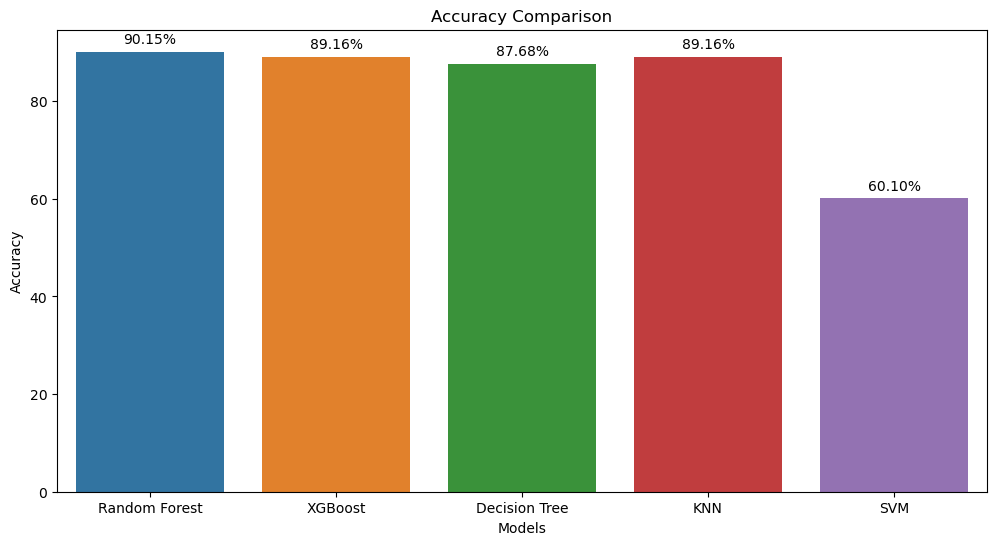

In [ ]:
# accuracy plot for all the models
models = ['Random Forest', 'XGBoost', 'Decision Tree', 'KNN', 'SVM']

accuracies = [accuracy_score(target_test, target_pred)*100 for target_pred in [grid.predict(feature_test), xgb.predict(feature_test), dtc.predict(feature_test), knn.predict(feature_test), svm.predict(feature_test)]]

plt.figure(figsize=(12, 6))
ax = sns.barplot(x=models, y=accuracies)
plt.title('Accuracy Comparison')
plt.xlabel('Models')
plt.ylabel('Accuracy')

# Add accuracy values on top of the bars
for i, accuracy in enumerate(accuracies):
    ax.text(i, accuracy + 1, f'{accuracy:.2f}%', ha='center', va='bottom')

plt.show()


few other algorithms


In [57]:
%pip install catboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 2.3 MB/s eta 0:00:00


In [108]:

from sklearn.linear_model import LogisticRegression
# from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
# from sklearn.svm import SVC
# from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import ExtraTreesClassifier, BaggingClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from catboost import CatBoostClassifier

In [109]:

# Initialize models
models = [
    ('Logistic Regression', LogisticRegression(solver='liblinear')),
    ('Naive Bayes', GaussianNB()),
    ('Neural Network', MLPClassifier()),
    ('Gradient Boosting', GradientBoostingClassifier()),
    ('Linear Discriminant Analysis', LinearDiscriminantAnalysis()),
    ('Gaussian Process', GaussianProcessClassifier()),
    ('Extra Trees', ExtraTreesClassifier()),
    ('Bagging', BaggingClassifier()),
    ('AdaBoost', AdaBoostClassifier()),
    ('CatBoost', CatBoostClassifier(iterations=100, learning_rate=0.1, depth=6, loss_function='MultiClass'))
]

# Train and evaluate each model
for name, model in models:
    if name == 'CatBoost':
        model.fit(feature_train, target_train, eval_set=(feature_test, target_test), verbose=False)
        predictions= model.predict(feature_test)
        accuracy = model.score(feature_test, target_test)
    else:
        model.fit(feature_train, target_train)
        accuracy = model.score(feature_test, target_test)
        predictions= model.predict(feature_test)
    print(f'{name} Accuracy: {accuracy * 100:.2f} %')
    print(f'{name} Classification Report:')
    print(classification_report(target_test, predictions, digits=4))
    print('\n')


Logistic Regression Accuracy: 59.61 %
Logistic Regression Classification Report:
              precision    recall  f1-score   support

           0     0.8511    0.6250    0.7207        64
           1     0.5918    0.7342    0.6554        79
           2     0.3966    0.3833    0.3898        60

    accuracy                         0.5961       203
   macro avg     0.6132    0.5808    0.5886       203
weighted avg     0.6158    0.5961    0.5975       203



Naive Bayes Accuracy: 60.10 %
Naive Bayes Classification Report:
              precision    recall  f1-score   support

           0     0.8511    0.6250    0.7207        64
           1     0.5564    0.9367    0.6981        79
           2     0.3478    0.1333    0.1928        60

    accuracy                         0.6010       203
   macro avg     0.5851    0.5650    0.5372       203
weighted avg     0.5876    0.6010    0.5559       203



Neural Network Accuracy: 61.58 %
Neural Network Classification Report:
              pre

after smote


In [110]:
from sklearn.metrics import classification_report

# Initialize models
models = [
    ('Logistic Regression', LogisticRegression(solver='liblinear')),
    ('Naive Bayes', GaussianNB()),
    ('Neural Network', MLPClassifier()),
    ('Gradient Boosting', GradientBoostingClassifier()),
    ('Linear Discriminant Analysis', LinearDiscriminantAnalysis()),
    ('Gaussian Process', GaussianProcessClassifier()),
    ('Extra Trees', ExtraTreesClassifier()),
    ('Bagging', BaggingClassifier()),
    ('AdaBoost', AdaBoostClassifier()),
    ('CatBoost', CatBoostClassifier(iterations=100, learning_rate=0.1, depth=6, loss_function='MultiClass'))
]

# Train and evaluate each model
for name, model in models:
    if name == 'CatBoost':
        model.fit(X_smote_train, y_smote_train, eval_set=(X_smote_test, y_smote_test), verbose=False)
        predictions = model.predict(X_smote_test)
        accuracy = model.score(X_smote_test, y_smote_test)
    else:
        model.fit(X_smote_train, y_smote_train)
        accuracy = model.score(X_smote_test, y_smote_test)
        predictions = model.predict(X_smote_test)

    print(f'{name} Accuracy: {accuracy * 100:.2f} %')
    print(f'{name} Classification Report:')
    print(classification_report(y_smote_test, predictions, digits=4))
    print('\n')


Logistic Regression Accuracy: 65.84 %
Logistic Regression Classification Report:
              precision    recall  f1-score   support

           0     0.8228    0.8228    0.8228        79
           1     0.5918    0.6905    0.6374        84
           2     0.5606    0.4625    0.5068        80

    accuracy                         0.6584       243
   macro avg     0.6584    0.6586    0.6557       243
weighted avg     0.6566    0.6584    0.6547       243



Naive Bayes Accuracy: 63.79 %
Naive Bayes Classification Report:
              precision    recall  f1-score   support

           0     0.9394    0.7848    0.8552        79
           1     0.5379    0.9286    0.6812        84
           2     0.4688    0.1875    0.2679        80

    accuracy                         0.6379       243
   macro avg     0.6487    0.6336    0.6014       243
weighted avg     0.6457    0.6379    0.6017       243



Neural Network Accuracy: 55.97 %
Neural Network Classification Report:
              pre

SHAP EXPLAINER::


[13:21:19] WARNING: /workspace/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


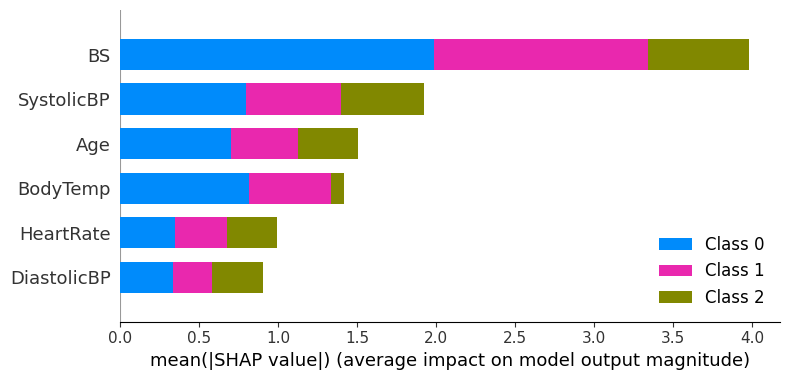

In [61]:
shap_explainer = shap.TreeExplainer(xgb)
shap_values = shap_explainer.shap_values(feature_train)

shap.summary_plot(shap_values=shap_values, features=feature_test, feature_names=features.columns, plot_type='bar')
# print(value)

In [ ]:
shap.initjs()

In [ ]:
shap_values = shap_explainer.shap_values(feature_test.iloc[10].values.reshape(1, -1))
shap.force_plot(shap_explainer.expected_value[1], shap_values[1], feature_test.iloc[10], feature_names=features.columns.tolist())


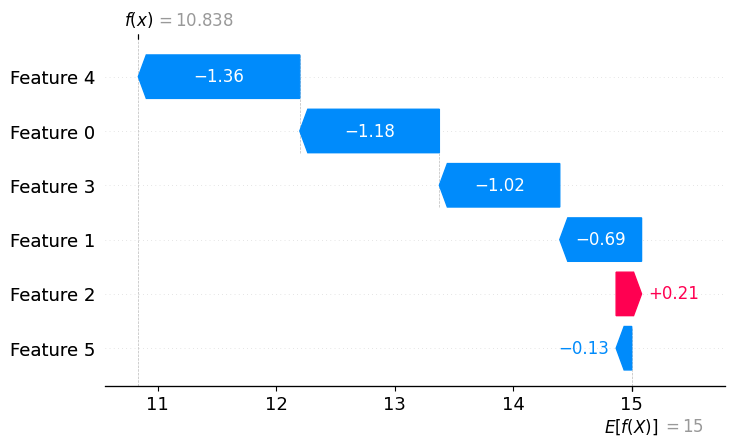

In [62]:

sample_index = 0
explanation = shap.Explanation(shap_values[sample_index], feature_train.iloc[sample_index, :])

# Define your custom feature names
feature_names = feature_train.columns.tolist()

# Create the waterfall plot with custom feature names
shap.plots.waterfall(explanation[0], max_display=10, show=False)

# Display the plot
plt.show()


SHAP Explainer on XGB model before SMOTE


[13:21:38] WARNING: /workspace/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


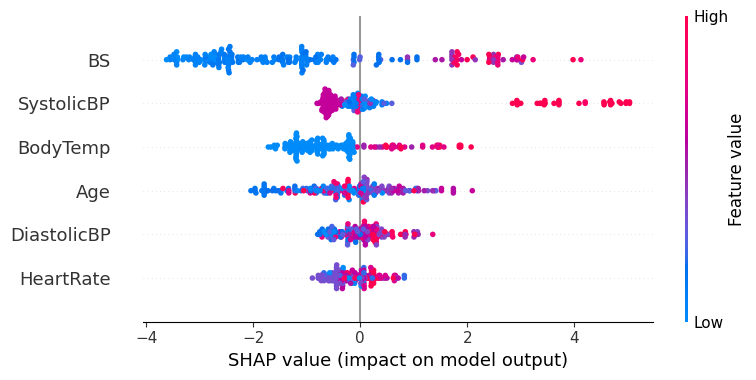

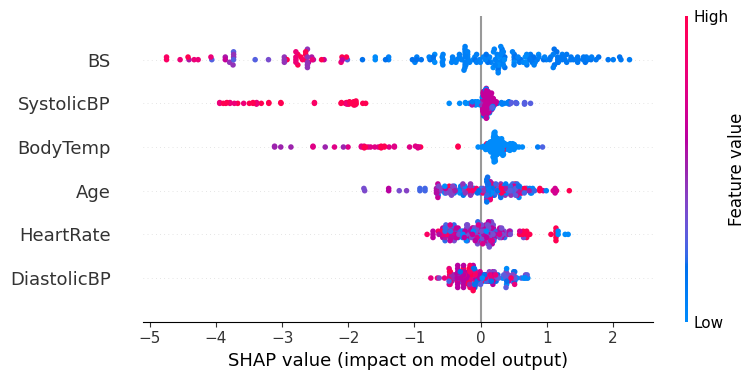

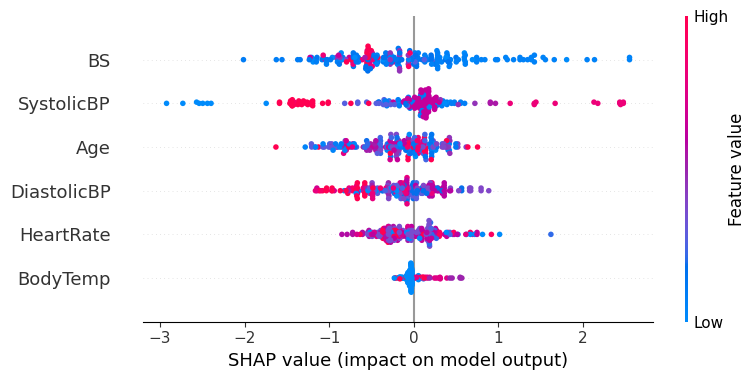

In [63]:
explainer = shap.Explainer(xgb)
shap_values = explainer.shap_values(feature_test)
for i in range(3):
    shap.summary_plot(shap_values[i], feature_test)

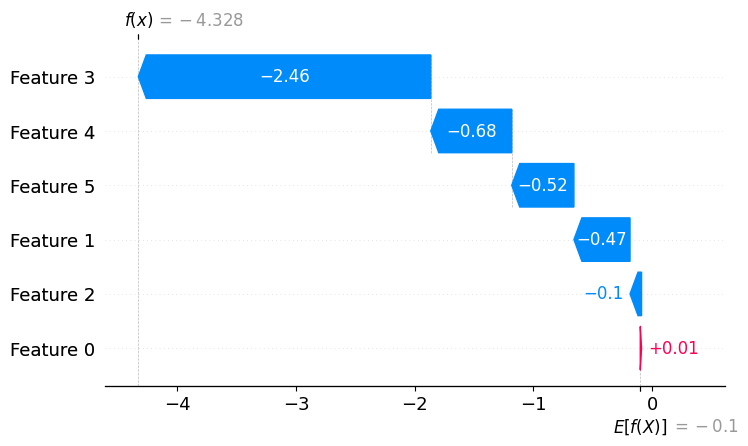

In [64]:

explanation = shap.Explanation(values=shap_values[0], base_values=explainer.expected_value)
shap.waterfall_plot(explanation[0])

SHAP Explainer on XGBoost after SMOTE


[13:21:58] WARNING: /workspace/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.
[13:21:59] WARNING: /workspace/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


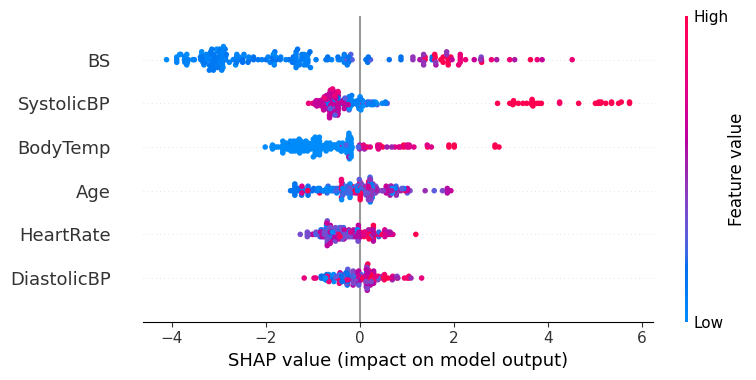

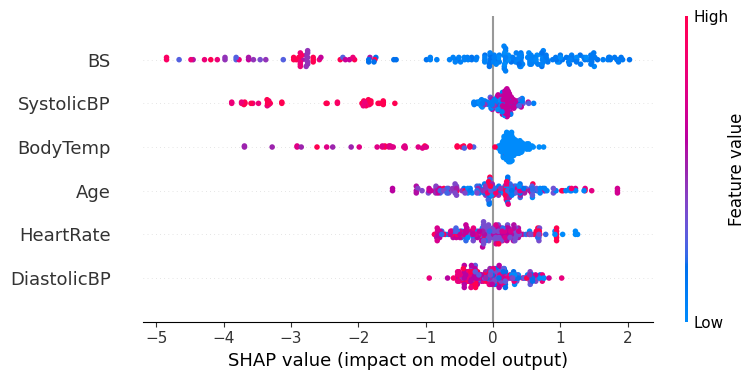

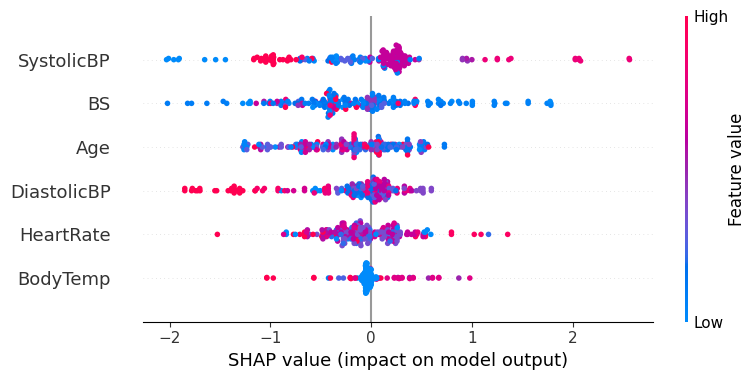

In [65]:
explainer = shap.Explainer(xgb_smote)
shap_values = explainer.shap_values(feature_test)
for i in range(3):
    shap.summary_plot(shap_values[i], feature_test)

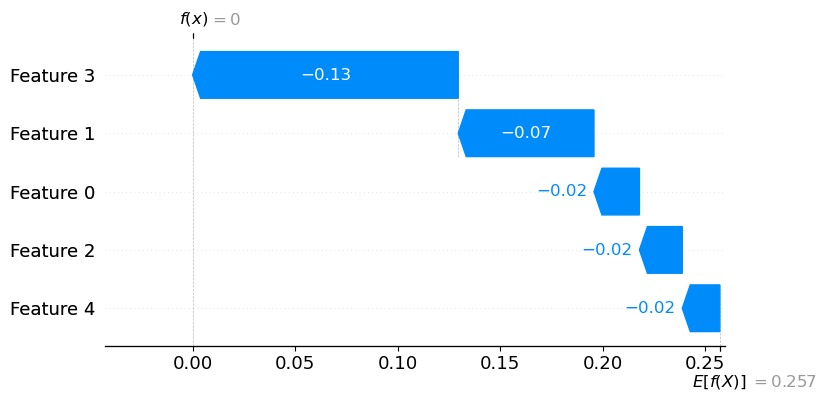

In [ ]:

explanation = shap.Explanation(values=shap_values[0], base_values=explainer.expected_value)
shap.waterfall_plot(explanation[0])

In [66]:
# LIME Explainer before SMOTE

explainer = lime.lime_tabular.LimeTabularExplainer(feature_train.values, feature_names=feature_train.columns.tolist(), class_names=['low risk', 'mid risk', 'high risk'], discretize_continuous=True)


In [67]:
# visualize the LIME explanation on XGB model before SMOTE
for sample_index in range(0, 4):
    exp = explainer.explain_instance(feature_test.values[sample_index], xgb.predict_proba, num_features=6, top_labels=1)
    exp.show_in_notebook(show_table=True, show_all=False)
    exp.save_to_file(f'lime_xgb_before_smote{sample_index}.html')

In [68]:
# LIME Explainer on XGBoost after SMOTE

explainer = lime.lime_tabular.LimeTabularExplainer(X_smote_train.values, feature_names=X_smote_train.columns.tolist(), class_names=['low risk', 'mid risk', 'high risk'], discretize_continuous=True)


In [69]:
# visualize the LIME explanation on XGBoost SMOTE
for sample_index in range(0, 4):
    exp = explainer.explain_instance(feature_test.values[sample_index], xgb_smote.predict_proba, num_features=6, top_labels=1)
    exp.show_in_notebook(show_table=True, show_all=False)
    exp.save_to_file(f'lime_xgb_after_smote{sample_index}.html')

In [ ]:
exp.save_to_file('lime_xgb_after_smote.html')